In [1]:
#Initialization
using Pkg
using LinearAlgebra
using OrdinaryDiffEq
using Plots
using StatsBase
theme(:dracula)

# Numerically Solving the 2-body Problem
----

## Scope: 
Here, we want to numerically integrate the two-body problem using orbital elements.

## Strategy:
 -We'll start by making a function that will get the initial conditions from the parameters. We'll be using the absolute coordinates. This one is actually portable to an N-body problem 
 
 -then a program that takes orbital elements and converts them to initial conditions to use in our integrator.

## Initial Values
We initially set one of the coordinates to be identically 0. This will give us issues later on, since it will be a moving center of mass and we'll have to 'recenter' it again.

In [2]:
M = [2.063, 1.018]
G=1
M = G * M
e = 0.591412
a=7.4957
T = 1000
dT = 1e-4
const n = 2 #Number of bodies
function InitialValues2b(a,e,m1,m2)
    Mₜ = m1+m2
    μ = m1*m2/Mₜ
    x0 = a*(1-e)
    y0 = 0
    z0=0
    vx0 = 0
    vy0 = μ* √(Mₜ *a *(1-e^2))/x0
    vz0=0
    return [[x0,y0,z0],[vx0,vy0,vz0]]
end
v0=transpose(reduce(vcat,[InitialValues2b(0,0,0,0)[1],InitialValues2b(a,e,M[1],M[2])[2]]))
r0=transpose(reduce(vcat,[InitialValues2b(0,0,0,0)[1],InitialValues2b(a,e,M[1],M[2])[1]]));


##Integrating
Here, we define our acceleration (The Kepler function). It uses a lot of demon-worship because I'm kind of stupid; Initially I made it take a vector of n(=2) vectors (i.e. $r=(\vec r_a,\vec r_b)$) and output the same type of object. This was, however, a bad idea, because ODEDiffEqs absolutely cannot handle or understand it. The demonic stuff is where I 'flatten' my n(=2) vectors for inputting, unflatten it for the function, and flatten it again for the output. I could have probably done this in a cleaner, better and more efficient way, but I was emotionally attatched to this (and now my code probably runs unimaginably slower)

Having said all of that, I then just do the standard ODE stuff: Set it up as a 'problem', solve it (With Symplectic Euler) and that's that.

In [3]:
function Kepler(dq,q,m,t) 
    ans= [Float64[0,0,0]]
    for k ∈ 1:n-1
        push!(ans,Float64[0,0,0])
    end
  
    r = ans
    for i ∈ 1:n
        r[i] = q[1+3*(i-1):3*i]
    end
    ans= [Float64[0,0,0]]
    for k ∈ 1:n-1
        push!(ans,Float64[0,0,0])
    end
    for i ∈ 1:n 
        for j ∈ 1:n
            if i != j
                R = r[i]-r[j]
                ans[i]= ans[i] - m[j]/(norm(R)^3) * (R[1:3])
            end
        end
    end
    return transpose(reduce(vcat,ans))
end 
ProblemKepler = SecondOrderODEProblem(Kepler,v0,r0,(0,T),M)
Solved = solve(ProblemKepler,dt=dT,SymplecticEuler())
#plot(Solved, vars=(10,11,12))
#Kepler(0.0,r0,M,0.0)
println("🍔")

🍔


----
# Graphing
## Paying for my sins
Well, remember when I said we were using absolute coordinates? I never said we were in a good reference frame, did I? Well, now's the time for penance and it'll be a gory manipulation of this horrible 'Solved' object. 

In [4]:
#r = Leapy[4:6,:]
#Ra = r/(1-(Ma/Mb)) 
#Rb = Ra - r
R= []
for i ∈ 1:n
    push!(R,Solved[3(n+i-1)+1:3(n+i-1)+3,:])
end
Rcm = M[1]*R[1]
for i ∈ 2:n
    Rcm = Rcm + M[i]R[i]
end
Rcm = Rcm/sum(M)

Rcenter=[]
for i ∈ 1:n
    push!(Rcenter,R[i] - Rcm)
end
#plot(Rcenter[1][1,:],Rcenter[1][2,:])

## The Payoff
Now, we just use Julia's beautiful graphing tools to make some graphs.

Int64


┌ Info: Saved animation to C:\Users\batti\AppData\Local\Temp\jl_XMnKfQBMtc.gif
└ @ Plots C:\Users\batti\.julia\packages\Plots\QZRtR\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\batti\\AppData\\Local\\Temp\\jl_XMnKfQBMtc.gif")
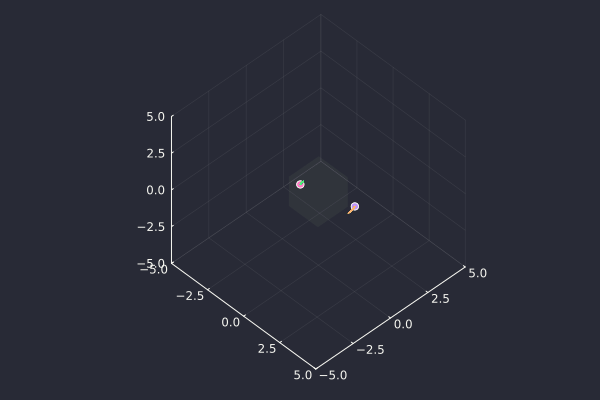

In [9]:
trail = 10000
max=5
Time = trunc(Int64,T/dT)
frames =  trunc(Int64,Time/1000)
println(typeof(Time))
@gif for i ∈ trail+1:frames:Time
    scatter([],xlim=[-max,max],ylim=[-max,max],zlim=[-max,max],markerstrokewidth=0,markersize=5,camera=(45+0.0001*i,45),legend=false)
    for j ∈ 1:n
    scatter!(Rcenter[j][1,i:i+1],Rcenter[j][2,i:i+1],Rcenter[j][3,i:i+1])
    plot!(Rcenter[j][1,i-trail:i],Rcenter[j][2,i-trail:i],Rcenter[j][3,i-trail:i], seriesalpha=range(0,1,trail+1))
    end
end